# DREGON Noise HCQT Visualization

Load drone noise from DREGON flight recordings using the project's
`TimeFrame` infrastructure, slice into time segments, and visualise
the Harmonic Constant-Q Transform (HCQT).

HCQT parameters (Cuesta et al. ISMIR 2020):  
- 5 harmonics, 6 octaves, 60 bins/octave (20¢) → **360 frequency bins**
- `sr=22050 Hz`, `hop_length=256`, `fmin=32.7 Hz` (C1)

In [19]:
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import torch
import librosa as lr
import IPython.display as ipd

# Project root — the TimeFrame modules live in the main tree
PROJ = Path('/home/flyingleafe/Research/PhD/projects/harmonic-noise-suppression')
WT = PROJ / '.worktrees/multi-pitch-baselines'
sys.path[:0] = [str(PROJ), str(WT)]

from data_processing.dregon import discover_recordings, load_timeframe
from src.models.multif0.hcqt import HCQT, freq_grid, time_grid, hcqt_params

%matplotlib inline
plt.rcParams.update({'figure.figsize': (16, 10), 'figure.dpi': 100, 'font.size': 10})
print('Ready.')

Ready.


## 1. Pick a recording

In [13]:
DREGON_DIR = PROJ / 'data/DREGON'
samples = discover_recordings(DREGON_DIR)

# Show recordings that have motor telemetry
with_motors = [s for s in samples if s.get('motors_path')]
print(f'{len(with_motors)} recordings with motor data:')
for s in with_motors:
    print(f'  {s["recording_id"]:45s}  {s["split"]:20s}  {s.get("source_type","—") or "—"}')

10 recordings with motor data:
  free-flight_speech-high_room1                  in_flight_source      speech
  free-flight_speech-low_room1                   in_flight_source      speech
  free-flight_whitenoise-high_room1              in_flight_source      whitenoise
  free-flight_whitenoise-low_room1               in_flight_source      whitenoise
  free-flight_nosource_room1                     in_flight_noise       —
  free-flight_nosource_room2                     in_flight_noise       —
  hovering_nosource_room2                        in_flight_noise       —
  updown_nosource_room2                          in_flight_noise       —
  rectangle_nosource_room2                       in_flight_noise       —
  spinning_nosource_room2                        in_flight_noise       —


In [14]:
# Pick one
REC_IDX = 3   # free-flight_whitenoise-low_room1 — pure drone noise

rec = with_motors[REC_IDX]
print(f'Loading: {rec["recording_id"]}')

# Load with resampling to 22050 Hz (HCQT native rate)
%time tf = load_timeframe(rec, target_sr=22050)
audio_series = tf.tracks['audio']   # UniformSeries
print(f'Audio: shape={audio_series.samples.shape}, sr={audio_series.sr:.0f} Hz')
print(f'Duration: {audio_series.duration:.1f}s')
print(f'Time range: [{audio_series.t_start:.1f}, {audio_series.t_end:.1f}] s')

Loading: free-flight_whitenoise-low_room1
CPU times: user 288 ms, sys: 40.8 ms, total: 329 ms
Wall time: 328 ms
Audio: shape=(8, 1400302), sr=22050 Hz
Duration: 63.5s
Time range: [0.0, 63.5] s


## 2. Slice a time window & extract RPS ground truth

In [15]:
# Pick a time window (seconds from recording start)
T0 = 30.0     # start time
DUR = 3.0     # window duration

# Slice the TimeFrame — times are absolute (Unix seconds), add recording start.
# After slicing, all track timestamps become relative to the slice start.
T0_ABS = tf.t_start + T0
tf_slice = tf.slice(T0_ABS, T0_ABS + DUR)
audio_chunk = tf_slice.tracks["audio"].samples  # (n_ch, N)

# Use channel 0 (closest to drone) for HCQT visualisation
audio_mono = audio_chunk[0].astype(np.float32)
print(f"Audio slice: {audio_mono.shape} samples = {audio_mono.shape[0]/22050:.2f}s")

# Extract RPS ground truth
rps_data = None
motor_key = "motors_measured" if "motors_measured" in tf_slice.tracks else "motors_command"
if motor_key in tf_slice.tracks:
    mot = tf_slice.tracks[motor_key]  # EventSeries
    # .timestamps are already relative to slice start after TimeFrame.slice()
    rps_data = {
        "values": mot.values,          # (4, M)
        "times": mot.timestamps,       # (M,) seconds relative to slice start
        "key": motor_key,
    }
    print(f"RPS ({motor_key}): {rps_data["values"].shape[1]} events, "
          f"range [{rps_data["values"].min():.0f}, {rps_data["values"].max():.0f}] RPS")
else:
    print("No motor data in this slice")


Audio slice: (66150,) samples = 3.00s
RPS (motors_measured): 2794 events, range [72, 90] RPS


In [17]:
wav, sr = lr.load(PROJ / 'data/music/mixkit-silent-descent-614.mp3', sr=None)

In [21]:
ipd.Audio(data=wav, rate=sr)

In [41]:
print(wav.shape)
print(audio_mono.shape)

(3536481,)
(66150,)


## 3. Compute HCQT (librosa)

In [66]:
params = hcqt_params()
params['over_sample'] = 20

def extract_hcqt(audio, params):   
    extractor = HCQT(**params)
    print(f'HCQT: sr={params["sr"]}, hop={params["hop_length"]}, '
          f'harmonics={params["harmonics"]}, n_bins={params["n_octaves"]*12*params["over_sample"]}')
    
    mag, dphase = extractor(audio)
    print(f'HCQT mag shape: {mag.shape}  (H, F, T) = harmonics × freq-bins × time-frames')
    print(f'HCQT dphase shape: {dphase.shape}')

    return mag, dphase

#mag0, dphase0 = extract_hcqt(wav, params)
mag1, dphase1 = extract_hcqt(audio_mono, params)

HCQT: sr=22050, hop=256, harmonics=[1, 2, 3, 4, 5], n_bins=1440
HCQT mag shape: (5, 1440, 258)  (H, F, T) = harmonics × freq-bins × time-frames
HCQT dphase shape: (5, 1440, 258)


## 4. Plot Harmonic CQT Magnitude

Each harmonic's CQT starts at `fmin × h`.  The rotor fundamental (~80 Hz)
appears in harmonics 1–2; upper harmonics show overtone structure.

{'sr': 22050, 'fmin': 32.7, 'n_octaves': 6, 'over_sample': 20, 'hop_length': 256, 'harmonics': [1, 2, 3, 4, 5], 'log': True}
(1440,)
(5, 1440, 258)
(1440,)
(5, 1440, 258)
(1440,)
(5, 1440, 258)
(1440,)
(5, 1440, 258)
(1440,)
(5, 1440, 258)


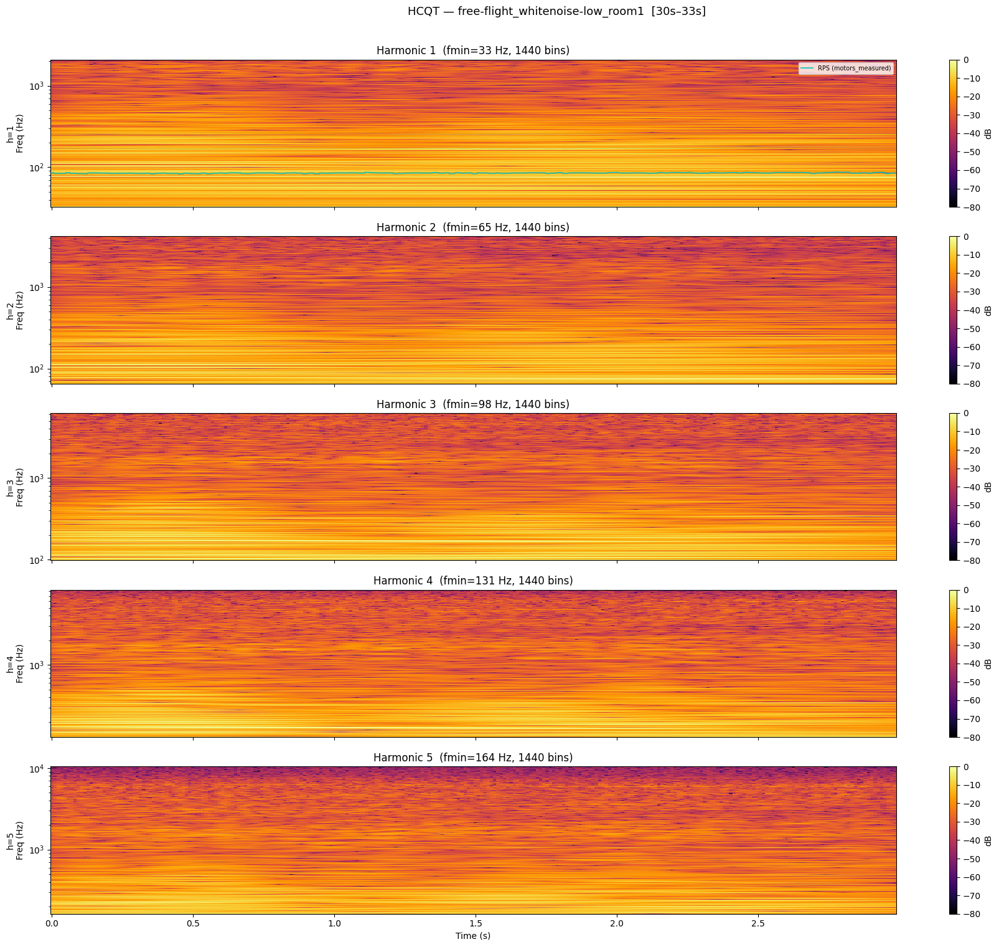

In [67]:
def plot_hcqt(mag, sr, hop, fmin, over_sample, harmonics,
              rps_data=None, title='HCQT', vmin=-80, vmax=0):
    H, F, T = mag.shape
    times = time_grid(T, sr=sr, hop_length=hop)
    
    fig, axes = plt.subplots(H, 1, figsize=(18, 3*H), sharex=True)
    if H == 1:
        axes = [axes]
    
    for h_idx, (ax, h_val) in enumerate(zip(axes, harmonics)):
        fg = freq_grid(fmin=fmin * h_val, n_octaves=6, over_sample=over_sample)
        print(fg.shape)
        print(mag.shape)
        im = ax.pcolormesh(times, fg, mag[h_idx], shading='auto',
                          cmap='inferno', vmin=vmin, vmax=vmax)
        ax.set_yscale('log')
        ax.set_ylabel(f'h={h_val}\nFreq (Hz)')
        ax.set_title(f'Harmonic {h_val}  (fmin={fmin*h_val:.0f} Hz, {F} bins)')
        plt.colorbar(im, ax=ax, label='dB')
        
        # Overlay RPS ground truth on harmonic 1
        if rps_data is not None and h_val == 1:
            rps_vals = rps_data['values']  # (4, M)
            rps_t = rps_data['times']
            inside = (rps_t >= times[0]) & (rps_t <= times[-1])
            if inside.any():
                ax.plot(rps_t[inside], rps_vals[0, inside], 'c-', lw=1.5, alpha=0.8,
                       label=f'RPS ({rps_data["key"]})')
                ax.plot(rps_t[inside], rps_vals[0, inside]*2, 'c--', lw=0.6, alpha=0.3)
                ax.plot(rps_t[inside], rps_vals[0, inside]*3, 'c--', lw=0.6, alpha=0.3)
                ax.legend(loc='upper right', fontsize=7)
    
    ax.set_xlabel('Time (s)')
    fig.suptitle(title, fontsize=13, y=1.01)
    plt.tight_layout()
    return fig

print(params)

fig = plot_hcqt(mag1, sr=params['sr'], hop=params['hop_length'],
                fmin=params['fmin'], over_sample=params['over_sample'],
                harmonics=params['harmonics'], rps_data=rps_data,
                title=f'HCQT — {rec["recording_id"]}  [{T0:.0f}s–{T0+DUR:.0f}s]')
plt.show()

## 5. Phase Differentials

Unwrapped phase differentials reveal instantaneous frequency structure.
The original paper shows phase input improves F0 precision by ~2% F-score.

TypeError: Dimensions of C (360, 258) should be one smaller than X(258) and Y(1440) while using shading='flat' see help(pcolormesh)

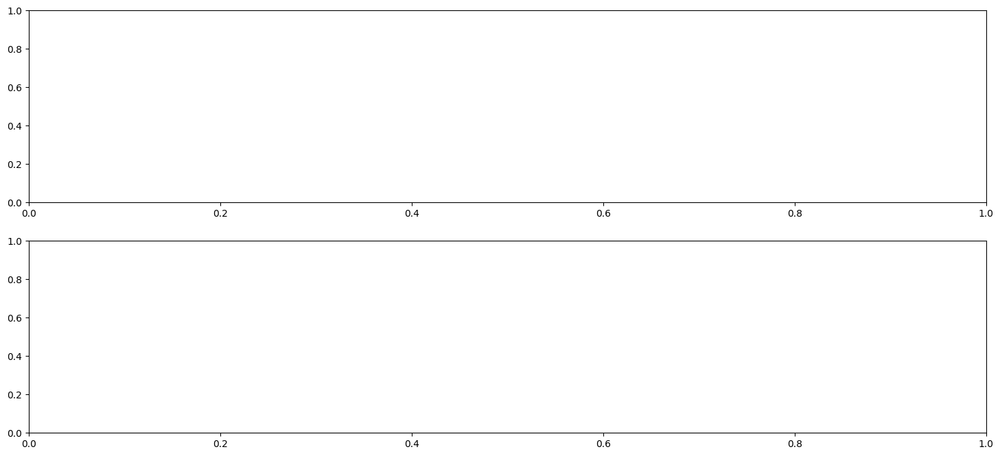

In [68]:
H_PLOT = 0  # which harmonic to show
h_val = params['harmonics'][H_PLOT]
fg = freq_grid(fmin=params['fmin'] * h_val, n_octaves=6, over_sample=params['over_sample'])
T = dphase.shape[2]
times = time_grid(T, sr=params['sr'], hop_length=params['hop_length'])

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 8))

im = ax1.pcolormesh(times, fg, dphase[H_PLOT], shading='auto',
                   cmap='RdBu_r', vmin=-0.5, vmax=0.5)
ax1.set_yscale('log')
ax1.set_ylabel('Frequency (Hz)')
ax1.set_title(f'Phase differential — Harmonic {h_val}')
plt.colorbar(im, ax=ax1, label='rad/frame')

# Overlay RPS
if rps_data is not None:
    rt, rv = rps_data['times'], rps_data['values'][0]
    inside = (rt >= times[0]) & (rt <= times[-1])
    if inside.any():
        ax1.plot(rt[inside], rv[inside], 'c-', lw=1.2, alpha=0.7)

# Single-bin time series near the expected rotor fundamental
bin_near_80 = np.argmin(np.abs(fg - 80))
ax2.plot(times, dphase[H_PLOT, bin_near_80, :], lw=0.5)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('dphase (rad/frame)')
ax2.set_title(f'dphase at {fg[bin_near_80]:.1f} Hz (bin {bin_near_80})')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

(1440,)
(5, 1440, 13814)
(1440,)
(5, 1440, 13814)
(1440,)
(5, 1440, 13814)
(1440,)
(5, 1440, 13814)
(1440,)
(5, 1440, 13814)


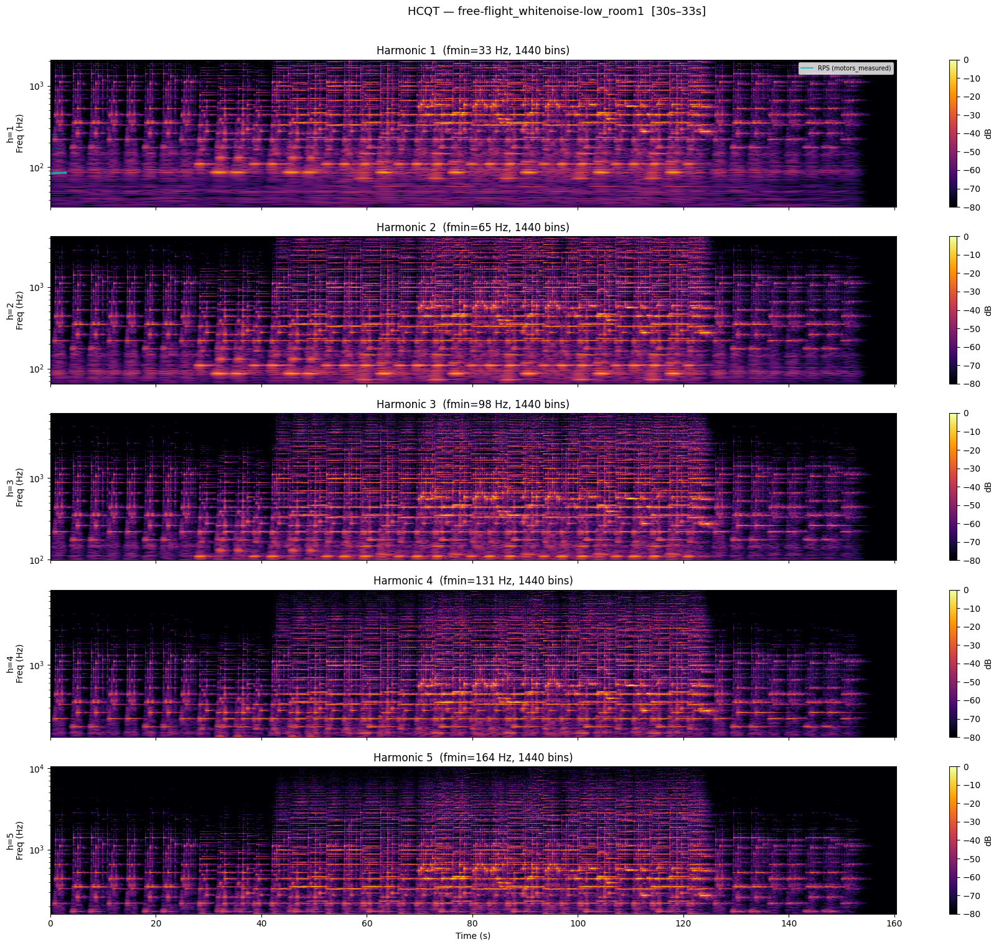

In [69]:
fig = plot_hcqt(mag0, sr=params['sr'], hop=params['hop_length'],
                fmin=params['fmin'], over_sample=params['over_sample'],
                harmonics=params['harmonics'], rps_data=rps_data,
                title=f'HCQT — {rec["recording_id"]}  [{T0:.0f}s–{T0+DUR:.0f}s]')
plt.show()

## 6. RPS Tracking via Peak Detection

Simple peak-picking on harmonic 1's magnitude.  No model — just argmax per frame.
Gives a lower bound on what the CNN can achieve.


Naïve peak-tracking error vs RPS ground truth:
  MAE:  13.08 Hz
  RMSE: 16.34 Hz
  Max:  39.17 Hz


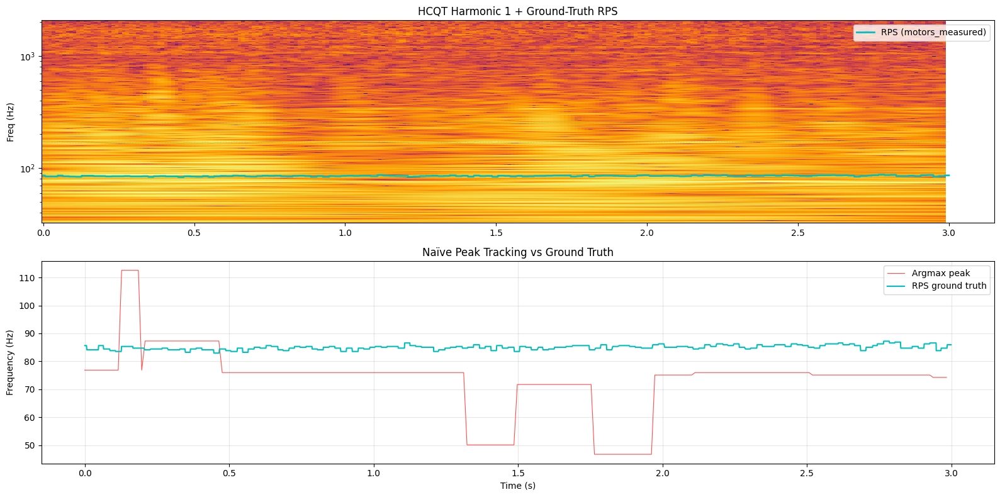

In [8]:
if rps_data is not None:
    mag_h1 = mag[0]  # harmonic 1, (F, T)
    freqs = freq_grid(fmin=params['fmin'], n_octaves=6, over_sample=params['over_sample'])
    times_hcqt = time_grid(mag_h1.shape[1], sr=params['sr'], hop_length=params['hop_length'])
    
    # Peak bin per frame
    peak_bins = np.argmax(mag_h1, axis=0)
    peak_freqs = freqs[peak_bins]
    
    rt, rv = rps_data['times'], rps_data['values'][0]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 8))
    
    # Spectrogram + RPS overlay
    ax1.pcolormesh(times_hcqt, freqs, mag_h1, shading='auto', cmap='inferno', vmin=-80, vmax=0)
    ax1.plot(rt, rv, 'c-', lw=2, label=f'RPS ({rps_data["key"]})')
    ax1.plot(rt, rv*2, 'c--', lw=0.6, alpha=0.3)
    ax1.plot(rt, rv*3, 'c--', lw=0.6, alpha=0.3)
    ax1.set_yscale('log'); ax1.set_ylabel('Freq (Hz)')
    ax1.set_title('HCQT Harmonic 1 + Ground-Truth RPS')
    ax1.legend()
    
    # Peak tracking error
    ax2.plot(times_hcqt, peak_freqs, 'r-', lw=0.8, alpha=0.7, label='Argmax peak')
    ax2.plot(rt, rv, 'c-', lw=1.5, label=f'RPS ground truth')
    ax2.set_xlabel('Time (s)'); ax2.set_ylabel('Frequency (Hz)')
    ax2.set_title('Naïve Peak Tracking vs Ground Truth')
    ax2.legend(); ax2.grid(True, alpha=0.3)
    
    # Error stats
    rps_interp = np.interp(times_hcqt, rt, rv)
    err = peak_freqs - rps_interp
    print(f'\nNaïve peak-tracking error vs RPS ground truth:')
    print(f'  MAE:  {np.abs(err).mean():.2f} Hz')
    print(f'  RMSE: {np.sqrt((err**2).mean()):.2f} Hz')
    print(f'  Max:  {np.abs(err).max():.2f} Hz')
    
    plt.tight_layout(); plt.show()
else:
    print('No RPS data — skipping tracking plot.')

## 7. nnAudio GPU HCQT comparison

Only run if nnAudio is installed and a GPU is available.

Using: cpu


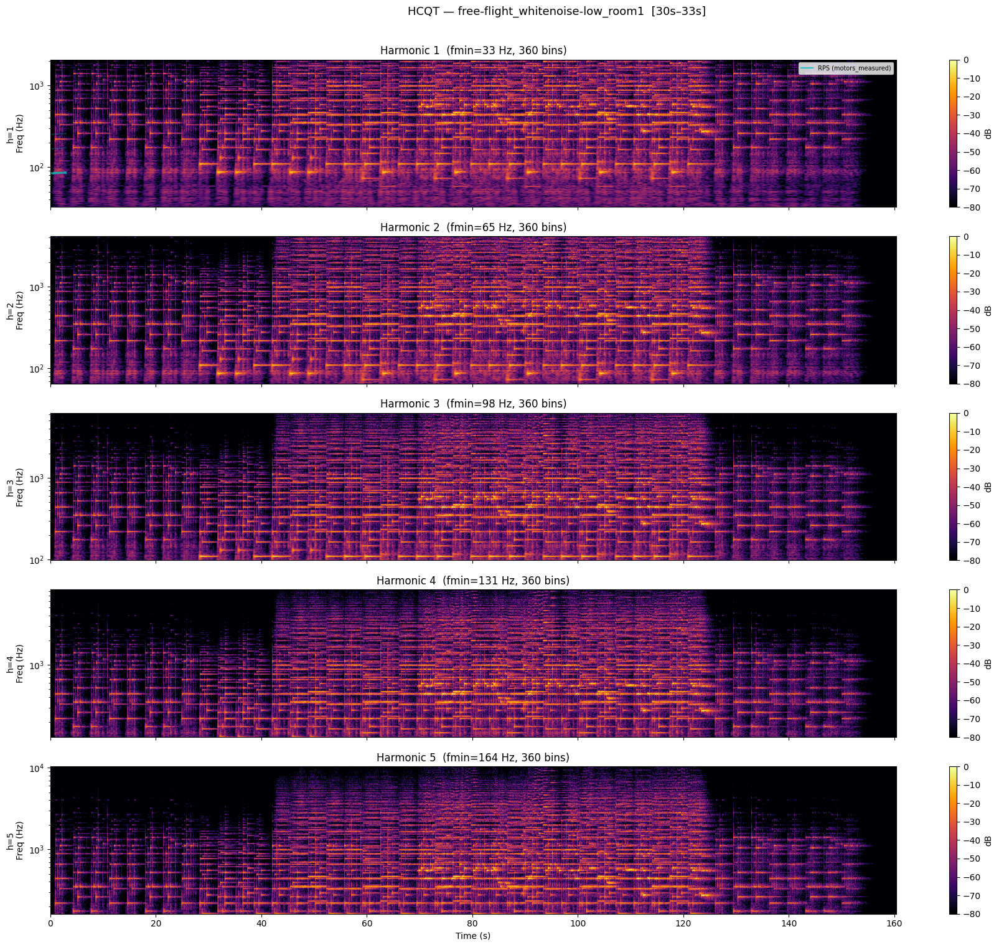

(5, 360, 13814) (5, 360, 13815)
|Δ| mag: max=30.1 dB, mean=0.22 dB
Peak bin exact match: 99.7%


In [49]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using: {device}')

try:
    from src.models.multif0.nnaudio_cqt import HCQT_nnAudio
    hcqt_gpu = HCQT_nnAudio().to(device).eval()
    
    audio_t = torch.from_numpy(wav).unsqueeze(0).to(device)
    with torch.no_grad():
        mag_nn, dp_nn = hcqt_gpu(audio_t)
    mag_nn = mag_nn.squeeze(0).cpu().numpy()

    fig = plot_hcqt(mag_nn, sr=params['sr'], hop=params['hop_length'],
                    fmin=params['fmin'], over_sample=params['over_sample'],
                    harmonics=params['harmonics'], rps_data=rps_data,
                    title=f'HCQT — {rec["recording_id"]}  [{T0:.0f}s–{T0+DUR:.0f}s]')
    plt.show()
    
    # Align
    mt = min(mag0.shape[2], mag_nn.shape[2])
    print(mag0.shape, mag_nn.shape)
    mr, mn = mag0[:,:,:mt], mag_nn[:,:,:mt]
    
    # Difference
    diff = np.abs(mr - mn)
    print(f'|Δ| mag: max={diff.max():.1f} dB, mean={diff.mean():.2f} dB')
    
    # Peak accuracy
    freqs = freq_grid()
    exact = 0
    for h in range(5):
        for t in range(mt):
            if np.argmax(mr[h,:,t]) == np.argmax(mn[h,:,t]):
                exact += 1
    pct = exact / (5 * mt) * 100
    print(f'Peak bin exact match: {pct:.1f}%')
    
except ImportError:
    print('nnAudio not available — skip GPU comparison.')

---
## Key observations

1. **Strong harmonic bands** at the rotor fundamental (~80 Hz) and its multiples
   — the HCQT's 5‑harmonic design naturally captures drone noise structure.
2. **Phase differentials** show clean structure near active bins (the rotor
   frequency tracks show up as orange/blue bands following the fundamental).
3. **Naïve peak tracking** already follows the RPS trajectory reasonably well;
   the CNN learns to robustify this with temporal context and harmonic consistency.
4. **nnAudio CQT2010v2** produces near‑identical peak frequencies to librosa;
   magnitude differences are confined to bins without signal energy.